<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# Capstone Project: Cyberbullying Classification 

## Abstract 

With rise of social media coupled with the Covid-19 pandemic, cyberbullying has reached all time highs. We can combat this by creating models to automatically flag potentially harmful tweets as well as break down the patterns of hatred.
- Original Data: [Cyberbullying](https://www.kaggle.com/andrewmvd/cyberbullying-classification)

## About this dataset


As social media usage becomes increasingly prevalent in every age group, a vast majority of citizens rely on this essential medium for day-to-day communication. Social media’s ubiquity means that cyberbullying can effectively impact anyone at any time or anywhere, and the relative anonymity
of the internet makes such personal attacks more difficult to stop than traditional bullying.

On April 15th, 2020, UNICEF issued a warning in response to the increased risk of cyberbullying during the COVID-19 pandemic due to widespread school closures, increased screen time, and decreased face-to-face social interaction. The statistics of cyberbullying are outright alarming: 36.5% of middle and high school students have felt cyberbullied and 87% have observed cyberbullying, with effects ranging from decreased academic performance to depression to suicidal thoughts.

In light of all of this, this dataset contains more than 47000 tweets labelled according to the class of cyberbullying:

- Age;
- Ethnicity;
- Gender;
- Religion;
- Other type of cyberbullying;
- Not cyberbullying

#### Find the best model to detect cyberbullying Tweets so to minimise/prevent bullying cases from happening

# Import libraries

In [1]:
## Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string
import regex as re
import spacy
import tensorflow as tf
import unicodedata
import emoji
import gensim
from gensim.models import Word2Vec


import time 
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk import word_tokenize
from textblob import TextBlob
import collections
from collections import Counter
from spellchecker import SpellChecker
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from sklearn.decomposition import LatentDirichletAllocation
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier,StackingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.linear_model import LogisticRegression, Lasso, RidgeClassifier
from sklearn.metrics import accuracy_score,precision_score, recall_score, roc_curve, classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.svm import LinearSVC
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
import xgboost
from xgboost import XGBClassifier

# Graphs and charts 
import plotly.graph_objects as go
import plotly.express as px

from PIL import Image

# import warnings
# warnings.filterwarnings('ignore')

In [2]:
print(emoji.emojize('Hi there! :revolving_hearts:'))

Hi there! 💞


# Load the data

In [3]:
data = pd.read_csv("cyberbullying_tweets.csv")
data.head()

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  object
dtypes: object(2)
memory usage: 745.3+ KB


In [5]:
type(data)

pandas.core.frame.DataFrame

In [6]:
len(data)

47692

In [7]:
data.describe()

,tweet_text,cyberbullying_type
count,47692,47692
unique,46017,6
top,RT @sailorhg: the intro for my hardware hackin...,religion
freq,2,7998


No missing data, we will start doing EDA
- EDA before cleaning tweets
- EDA after cleaning Tweets

# EDA 
- cyberbullying_type

In [8]:
data.cyberbullying_type.unique()

array(['not_cyberbullying', 'gender', 'religion', 'other_cyberbullying',
       'age', 'ethnicity'], dtype=object)

In [9]:
#Replace education data for better understanding
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('gender','cyberbullying')
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('religion','cyberbullying')
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('other_cyberbullying','cyberbullying')
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('age','cyberbullying')
data['cyberbullying_Yes_No']=data['cyberbullying_type'].str.replace('ethnicity','cyberbullying')

In [10]:
data['cyberbullying_Yes_No']=data['cyberbullying_type'].apply(lambda x: 'cyberbullying' if x != 'not_cyberbullying' else x)

In [11]:
data.cyberbullying_type.unique()

array(['not_cyberbullying', 'gender', 'religion', 'other_cyberbullying',
       'age', 'ethnicity'], dtype=object)

In [12]:
data.cyberbullying_Yes_No.unique()

array(['not_cyberbullying', 'cyberbullying'], dtype=object)

In [13]:
data.head()

,tweet_text,cyberbullying_type,cyberbullying_Yes_No
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying


In [14]:
#Dataset is balanced for different categories 
fig = go.Figure(data=[go.Pie(labels=data['cyberbullying_type'].value_counts().index, values=data['cyberbullying_type'].value_counts().values)])
fig.update_layout(height=400, width=500, title_text="Pie chart showing cyberbullying_type")
fig.show()

Target variable consist 6 class which is: not_cyberbullying, gender, religion, other_cyberbullying, age, and ethnicity. We can see that our target variable seems to have balance composition (around 16% per class). So we dont need to do balancing.

In [15]:
data['cyberbullying_type'].value_counts()

religion               7998
age                    7992
gender                 7973
ethnicity              7961
not_cyberbullying      7945
other_cyberbullying    7823
Name: cyberbullying_type, dtype: int64

In [16]:
#The data is pretty well balanced
fig = go.Figure(data=[go.Pie(labels=data['cyberbullying_Yes_No'].value_counts().index, values=data['cyberbullying_Yes_No'].value_counts().values)])
fig.update_layout(height=400, width=500, title_text="Pie chart showing cyberbullying_Yes_No")
fig.show()

In [17]:
data['cyberbullying_Yes_No'].value_counts()

cyberbullying        39747
not_cyberbullying     7945
Name: cyberbullying_Yes_No, dtype: int64

# EDA
- tweet_text

In [18]:
data.sample(10)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No
9543,.@basicrepublican Pretzel logic is understatem...,gender,cyberbullying
28895,We don't have to stop liking games because the...,other_cyberbullying,cyberbullying
18251,"Idiot, first of who takes guns or stones in ha...",religion,cyberbullying
12597,he got his start with rape jokes and using gay...,gender,cyberbullying
4811,@alexandre_alves Isso é bullying. huahau,not_cyberbullying,not_cyberbullying
6577,Been dying for a 🚬 all of #MKR. #smokerlife,not_cyberbullying,not_cyberbullying
37839,That’s an absolute NO from my family! The firs...,age,cyberbullying
7200,É bullying voce ir na aula em plena segunda fe...,not_cyberbullying,not_cyberbullying
40174,If the past couple of days/weeks/months/all of...,ethnicity,cyberbullying
1341,Miley fue victima del bullying. #FactsMiley,not_cyberbullying,not_cyberbullying


### EDA before cleaning the tweets

In [19]:
all_labels = data['cyberbullying_type'].unique()

In [20]:
def average_word_length(text):
    words = text.split()
    word_count = len(words)
    word_length = 0
    for word in words:
        word_length += len(word)
    avg_word_length = round(word_length / word_count,2)
    return avg_word_length


data['tweet_length'] = data['tweet_text'].apply(lambda x: len(x.split()))
data['average_word_length'] = data['tweet_text'].apply(average_word_length)

In [21]:
fig = px.box(data,
             x = 'cyberbullying_type',
             y = 'tweet_length',
             color = 'cyberbullying_type',
             color_discrete_sequence = px.colors.diverging.curl,
             title = 'Boxplot of Tweet Lengths per class'
)


fig.update_yaxes(range = [0,80])
fig.show()

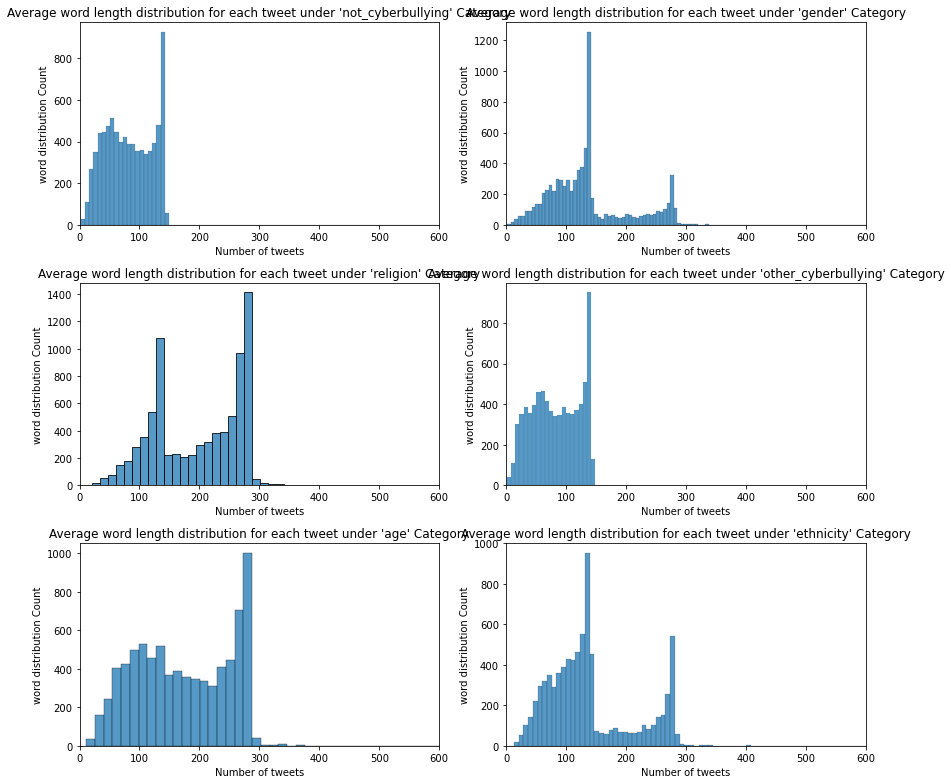

In [22]:
#Tweet Length before cleaning the tweets
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 11))
k=0
for i in range(3):
    for j in range(2):
        cat = all_labels[k]
        tweet_len = data[data['cyberbullying_type']==cat]['tweet_text'].apply(lambda x:len(x) ) 
        sns.histplot(tweet_len, ax=ax[i,j]);
        ax[i,j].set_title("Average word length distribution for each tweet under '{}' Category".format(cat));
        ax[i,j].set_xlim(0,600);
        ax[i,j].set_xlabel('Number of tweets');
        ax[i,j].set_ylabel('word distribution Count');

        plt.tight_layout();
        k+=1

In [23]:
# Viz: Word lengths per class
fig = px.box(data,
             x = 'cyberbullying_type',
             y = 'average_word_length',
             color = 'cyberbullying_type',
             color_discrete_sequence = px.colors.diverging.curl,
             title = 'Boxplot of Words Lengths per cyberbullying types'
)


fig.update_yaxes(range=[0,20])
fig.show()

In [24]:
def get_punct_count(text_lst):
    """Get Punctuation Counters for EDA"""
    punct_pattern = r"[!@#$%^&*()_\-=+}{\[\]|\\/<>,.?~`]?"
    all_puncts = list()
    for txt in text_lst:
        m_lst = re.findall(punct_pattern, txt)
        all_puncts.extend(m_lst)
    punct_counts = collections.Counter(all_puncts)
    return punct_counts

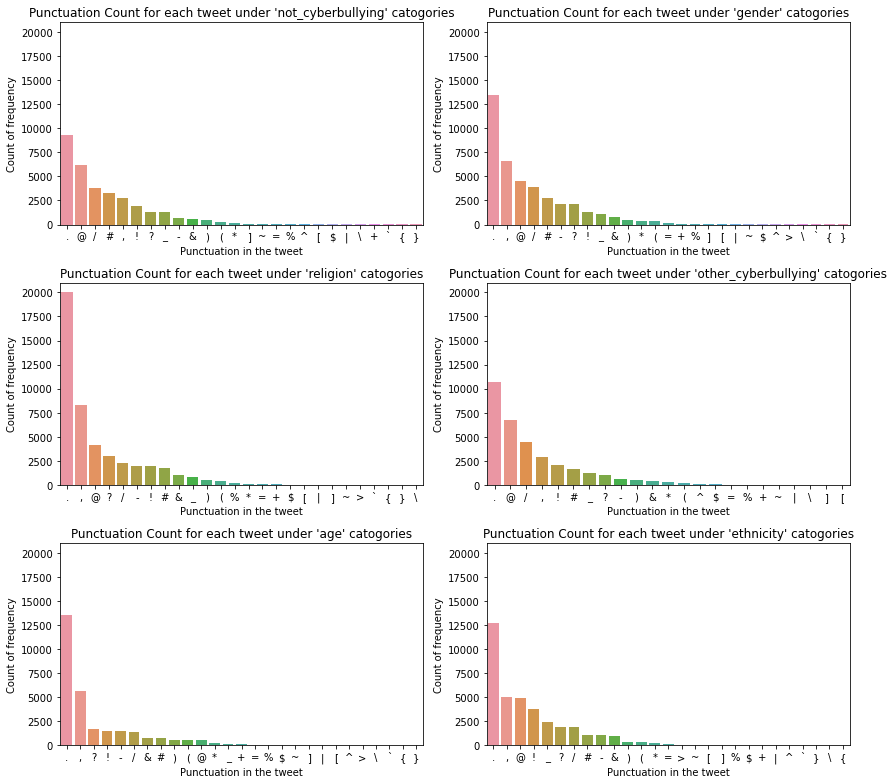

In [25]:
#Punctuation Count before cleaning the tweets
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 11))
k=0
for i in range(3):
    for j in range(2):
        cat = all_labels[k]
        tweet_punct = get_punct_count(data[data['cyberbullying_type']==cat]['tweet_text'].tolist())
        tweet0_punct_cnt_sorted = tweet_punct.most_common()[1:]
        l0, h0, = [],[]
        _ = [(l0.append(i[0]), h0.append(i[1])) for i in tweet0_punct_cnt_sorted]

        sns.barplot(x=list(range(len(l0))), y=h0, ax=ax[i,j]);
        ax[i,j].set_ylim(top=21000);
        ax[i,j].set_xticks(ticks = list(range(len(l0))), labels=l0);
        ax[i,j].set_xlabel('Punctuation in the tweet');
        ax[i,j].set_ylabel('Count of frequency');
        ax[i,j].set_title("Punctuation Count for each tweet under '{}' catogories".format(cat));
        k+=1
fig.tight_layout();

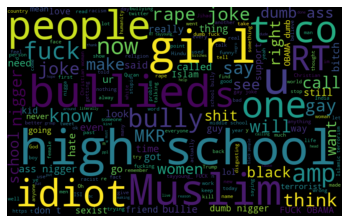

In [26]:
allwords = ' '.join([twts for twts in data['tweet_text']])
wordCloud = WordCloud(width=800,height=500,random_state=21,max_font_size=115).generate(allwords)

plt.imshow(wordCloud, interpolation="bilinear")
plt.axis('off')
plt.show()

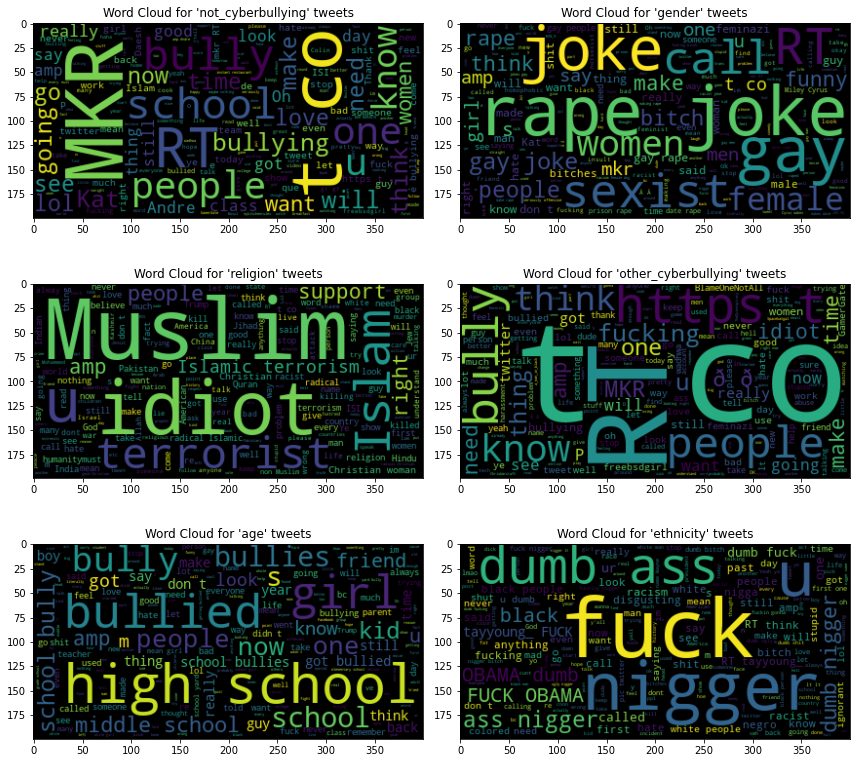

In [27]:
#Common Words appeared the most frequently before cleaning the Text
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(12, 11))
k=0
for i in range(3):
    for j in range(2):
        cat = all_labels[k]
        wordcloud = WordCloud().generate(" ".join(data[data['cyberbullying_type']==cat]['tweet_text'].tolist()))
        # Display the generated image:
        ax[i,j].imshow(wordcloud, interpolation='bilinear');
        ax[i,j].set_title("Word Cloud for '{}' tweets".format(cat));
        k+=1
fig.tight_layout();

In [28]:
#The overwhelming majority of tweets end at 62 tokens
fig = px.histogram(data,
                   x = 'tweet_length',
                   title = 'Distribution of Tweet Length',
                   color_discrete_sequence = ['#3ac2f9'],
                   opacity = 0.7,
                  )

fig.show()

#### Top 50 words for each cyberbullying type before cleaning the data

In [29]:
for cyber_type in data.cyberbullying_type.unique():
    
    top50_word = data.tweet_text[data.cyberbullying_type==cyber_type].str.split(expand=True).stack().value_counts()[:50]
    
    fig = px.bar(top50_word, color=top50_word.values, color_continuous_scale=px.colors.sequential.RdPu, custom_data=[top50_word.values])
    fig.update_traces(hovertemplate='<b>Count: </b>%{customdata[0]}')
    
    fig.update_layout(title=f"Top 50 words in all tweets under {cyber_type} Category (before cleaning)",
                     template='simple_white',
                     hovermode='x unified')
    fig.show()

### EDA after cleaning the tweets 

In [30]:
def clean_tags_mentions_single(txt):
    patt_mention = r"[@]\w+"
    patt_tags = r"[#]\w+"
    clean_str = re.sub(patt_mention, "", txt)
    clean_str = re.sub(patt_tags, "", clean_str)
    clean_str = re.sub(r'[0-9]+', '', clean_str)
    clean_str = re.sub("'ve", " have ", clean_str)
    clean_str = re.sub("&amp;", "", clean_str)
    clean_str = re.sub("\n", "", clean_str)
    return " ".join(clean_str.split())

In [31]:
data['cleaned_text'] = data['tweet_text'].apply(clean_tags_mentions_single)
data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"In other words , your food was crapilicious!"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,Why is so white?
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore? Or more red velvet cupcakes?
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh. :P thanks for the heads up, but not too c..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,This is an ISIS account pretending to be a Kur...


In [32]:
def lower(text):
    return text.lower()
data['cleaned_text2'] = data['cleaned_text'].apply(lower)
data['cleaned_text'] = data['cleaned_text2']
data.drop('cleaned_text2',axis='columns',inplace=True)
data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"in other words , your food was crapilicious!"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,why is so white?
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore? or more red velvet cupcakes?
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh. :p thanks for the heads up, but not too c..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,this is an isis account pretending to be a kur...


In [33]:
def clean_text(tweet):
    #remove hashtags again
    pattern = re.compile(r"(#[A-Za-z0-9]+|@[A-Za-z0-9]+|https?://\S+|www\.\S+|\S+\.[a-z]+|RT @)")
    tweet = pattern.sub('', tweet)
    tweet = " ".join(tweet.split())
    tweet = re.sub(r"(https?:\/\/)(\s)*(www\.)?(\s)*((\w|\s)+\.)*([\w\-\s]+\/)*([\w\-]+)((\?)?[\w\s]*=\s*[\w\%&]*)*","",tweet) # remove URLs
    tweet = re.sub(r"#","",tweet) #removing the #symbol
    tweet = re.sub(r"RT[\s]+","",tweet) #removing RT
    tweet = re.sub(r"https?:\/\/S+","",tweet) #removing hyper link
    tweet = re.sub('[!:?.]', '', tweet)  # remove punctuations
    tweet = re.sub(r'[^\x00-\x7f]',r'', tweet) #remove non utf8/ascii characters such as '\x9a\x91\x97\x9a\x97'
    tweet = re.sub(r"can\'t", "can not", tweet)#remove contractions 'can not'
    tweet = re.sub(r"n\'t", " not", tweet)#remove contractions 'not'
    tweet = re.sub(r"\'re", " are", tweet)#remove contractions 'are'
    tweet = re.sub(r"\'s", " is", tweet)#remove contractions 'is'
    tweet = re.sub(r"\'d", " would", tweet)#remove contractions 'would'
    tweet = re.sub(r"\'ll", " will", tweet)#remove contractions 'will'
    tweet = re.sub(r"\'t", " not", tweet)#remove contractions 'not'
    tweet = re.sub(r"\'ve", " have", tweet)#remove contractions 'have'
    tweet = re.sub(r"\'m", " am", tweet)#remove contractions 'am'
    return tweet

In [34]:
data['cleaned_text2'] = data['cleaned_text'].apply(clean_text)
data['cleaned_text'] = data['cleaned_text2']
data.drop('cleaned_text2',axis='columns',inplace=True)
data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"in other words , your food was crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,why is so white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh p thanks for the heads up, but not too con..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,this is an isis account pretending to be a kur...


In [35]:
def remove_emojis_single(txt):
    return emoji.get_emoji_regexp().sub(u'', txt)

In [36]:
data['cleaned_text2'] = data['cleaned_text'].apply(clean_text)
data['cleaned_text'] = data['cleaned_text2']
data.drop('cleaned_text2',axis='columns',inplace=True)
data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"in other words , your food was crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,why is so white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh p thanks for the heads up, but not too con..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,this is an isis account pretending to be a kur...


In [37]:
def remove_emoji_again(txt):
    return re.sub(emoji.get_emoji_regexp(), r"", txt) #remove emoji

In [38]:
data['cleaned_text2'] = data['cleaned_text'].apply(clean_text)
data['cleaned_text'] = data['cleaned_text2']
data.drop('cleaned_text2',axis='columns',inplace=True)
data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"in other words , your food was crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,why is so white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh p thanks for the heads up, but not too con..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,this is an isis account pretending to be a kur...


In [39]:
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
stop_words.update(['I','wa','p','like','o','e','rt', 'mkr', 'didn', 'bc', 'n', 'm', 'im', 'll', 'y', 've', 'u', 'ur', 'don', 't', 's','etc'])

In [40]:
data['cleaned_stopwords'] = data['cleaned_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
data.head(10)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"in other words , your food was crapilicious","words , food crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,why is so white,white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes,classy whore red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh p thanks for the heads up, but not too con...","meh thanks heads up, concerned another angry d..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,this is an isis account pretending to be a kur...,"isis account pretending kurdish account islam,..."
5,"@Raja5aab @Quickieleaks Yes, the test of god i...",not_cyberbullying,not_cyberbullying,23,4.74,"yes, the test of god is that good or bad or in...","yes, test god good bad indifferent weird whate..."
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying,not_cyberbullying,10,4.50,itu sekolah ya bukan tempat bully ga jauh kaya...,itu sekolah ya bukan tempat bully ga jauh kaya...
7,Karma. I hope it bites Kat on the butt. She is...,not_cyberbullying,not_cyberbullying,14,3.57,karma i hope it bites kat on the butt she is j...,karma hope bites kat butt nasty
8,@stockputout everything but mostly my priest,not_cyberbullying,not_cyberbullying,6,6.50,everything but mostly my priest,everything mostly priest
9,Rebecca Black Drops Out of School Due to Bully...,not_cyberbullying,not_cyberbullying,9,4.67,rebecca black drops out of school due to bullying,rebecca black drops school due bullying


Stopwords are the words in any language which does not add much meaning to a sentence. They can safely be ignored without sacrificing the meaning of the sentence. For some search engines, these are some of the most common, short function words, such as the, is, at, which, and on.

In [41]:
stopword = stopwords.words('english')
def remove_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stopword])

In [42]:
data['cleaned_stopwords2'] = data['cleaned_stopwords'].apply(remove_stopwords)
data['cleaned_stopwords'] = data['cleaned_stopwords2']
data.drop('cleaned_stopwords2',axis='columns',inplace=True)
data.head(10)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"in other words , your food was crapilicious","words , food crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,why is so white,white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes,classy whore red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh p thanks for the heads up, but not too con...","meh thanks heads up, concerned another angry d..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,this is an isis account pretending to be a kur...,"isis account pretending kurdish account islam,..."
5,"@Raja5aab @Quickieleaks Yes, the test of god i...",not_cyberbullying,not_cyberbullying,23,4.74,"yes, the test of god is that good or bad or in...","yes, test god good bad indifferent weird whate..."
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying,not_cyberbullying,10,4.50,itu sekolah ya bukan tempat bully ga jauh kaya...,itu sekolah ya bukan tempat bully ga jauh kaya...
7,Karma. I hope it bites Kat on the butt. She is...,not_cyberbullying,not_cyberbullying,14,3.57,karma i hope it bites kat on the butt she is j...,karma hope bites kat butt nasty
8,@stockputout everything but mostly my priest,not_cyberbullying,not_cyberbullying,6,6.50,everything but mostly my priest,everything mostly priest
9,Rebecca Black Drops Out of School Due to Bully...,not_cyberbullying,not_cyberbullying,9,4.67,rebecca black drops out of school due to bullying,rebecca black drops school due bullying


In [43]:
lemmatizer = WordNetLemmatizer()
def lemmatize_word(text):
    return " ".join(lemmatizer.lemmatize(word) for word in str(text).split())

Lemmatization is the process of grouping together the different inflected forms of a word so they can be analyzed as a single item. Lemmatization is similar to stemming but it brings context to the words.

In [44]:
data['cleaned_stopwords2'] = data['cleaned_stopwords'].apply(lemmatize_word)
data['cleaned_stopwords'] = data['cleaned_stopwords2']
data.drop('cleaned_stopwords2',axis='columns',inplace=True)
data.head(20)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"in other words , your food was crapilicious","word , food crapilicious"
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,why is so white,white
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes,classy whore red velvet cupcake
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh p thanks for the heads up, but not too con...","meh thanks head up, concerned another angry du..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,this is an isis account pretending to be a kur...,"isi account pretending kurdish account islam, lie"
5,"@Raja5aab @Quickieleaks Yes, the test of god i...",not_cyberbullying,not_cyberbullying,23,4.74,"yes, the test of god is that good or bad or in...","yes, test god good bad indifferent weird whate..."
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying,not_cyberbullying,10,4.50,itu sekolah ya bukan tempat bully ga jauh kaya...,itu sekolah ya bukan tempat bully ga jauh kaya...
7,Karma. I hope it bites Kat on the butt. She is...,not_cyberbullying,not_cyberbullying,14,3.57,karma i hope it bites kat on the butt she is j...,karma hope bite kat butt nasty
8,@stockputout everything but mostly my priest,not_cyberbullying,not_cyberbullying,6,6.50,everything but mostly my priest,everything mostly priest
9,Rebecca Black Drops Out of School Due to Bully...,not_cyberbullying,not_cyberbullying,9,4.67,rebecca black drops out of school due to bullying,rebecca black drop school due bullying


In [ ]:
data['tweet_text']

#### Top 50 words for each cyberbullying type after cleaning the data

In [45]:
for cyber_type in data.cyberbullying_type.unique():
    
    top50_word = data.cleaned_stopwords[data.cyberbullying_type==cyber_type].str.split(expand=True).stack().value_counts()[:50]
    
    fig = px.bar(top50_word, color=top50_word.values, color_continuous_scale=px.colors.sequential.RdPu, custom_data=[top50_word.values])
    fig.update_traces(hovertemplate='<b>Count: </b>%{customdata[0]}')
    
    fig.update_layout(title=f"Top 50 words in all tweets under {cyber_type} Category (after cleaning)",
                     template='simple_white',
                     hovermode='x unified')

    fig.show()

#### Common words appear in the tweets after cleaning the text

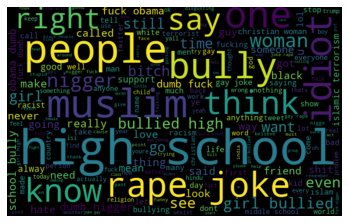

In [46]:
allwords = ' '.join([twts for twts in data['cleaned_stopwords']])
wordCloud = WordCloud(width=800,height=500,random_state=21,max_font_size=115).generate(allwords)

plt.imshow(wordCloud, interpolation="bilinear")
plt.axis('off')
plt.show()

#### Create a function to get the Subjectivity and Polarity
- Create a function to compute the negative, neutral and positive analysis

In [47]:
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

def getPolarity(text):
    return TextBlob(text).sentiment.polarity

data['Subjectivity'] = data['cleaned_stopwords'].apply(getSubjectivity)
data['Polarity'] = data['cleaned_stopwords'].apply(getPolarity)

data.head()

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"in other words , your food was crapilicious","word , food crapilicious",0.00,0.00
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,why is so white,white,0.00,0.00
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes,classy whore red velvet cupcake,0.45,0.05
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh p thanks for the heads up, but not too con...","meh thanks head up, concerned another angry du...",0.60,-0.15
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,this is an isis account pretending to be a kur...,"isi account pretending kurdish account islam, lie",0.00,0.00


In [48]:
def getAnalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'
    

data['Sentiment_Analysis'] = data['Polarity'].apply(getAnalysis)

data.head(5)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity,Sentiment_Analysis
0,"In other words #katandandre, your food was cra...",not_cyberbullying,not_cyberbullying,9,5.89,"in other words , your food was crapilicious","word , food crapilicious",0.00,0.00,Neutral
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,not_cyberbullying,14,7.29,why is so white,white,0.00,0.00,Neutral
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes,classy whore red velvet cupcake,0.45,0.05,Positive
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,not_cyberbullying,18,4.72,"meh p thanks for the heads up, but not too con...","meh thanks head up, concerned another angry du...",0.60,-0.15,Negative
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,not_cyberbullying,18,4.72,this is an isis account pretending to be a kur...,"isi account pretending kurdish account islam, lie",0.00,0.00,Neutral


# Encoding Features

In [49]:
data1 = data.copy()

In [50]:
data1['cyberbullying_type'] = data1['cyberbullying_type'].copy()
data1['cyberbullying_type'].replace(
    {'not_cyberbullying': 0,
             'gender': 1,
             'religion': 2,
             'age': 3,
             'ethnicity': 4,
     'other_cyberbullying': 5},
        inplace=True)
data1.head(3)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity,Sentiment_Analysis
0,"In other words #katandandre, your food was cra...",0,not_cyberbullying,9,5.89,"in other words , your food was crapilicious","word , food crapilicious",0.00,0.00,Neutral
1,Why is #aussietv so white? #MKR #theblock #ImA...,0,not_cyberbullying,14,7.29,why is so white,white,0.00,0.00,Neutral
2,@XochitlSuckkks a classy whore? Or more red ve...,0,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes,classy whore red velvet cupcake,0.45,0.05,Positive


In [51]:
data1.cleaned_stopwords[data1.cyberbullying_type == 5].head(3)

23916                             fyi, look caught botter,
23917    need switch organization-based github, want pa...
23918    rmaed monoprice shoddy power brick getting ref...
Name: cleaned_stopwords, dtype: object

In [52]:
#from sklearn.preprocessing import LabelEncoder
#data1 = data.copy()
#le = LabelEncoder()
#feature = ["cyberbullying_type"]

#for col in feature:
#    data1[col] = le.fit_transform(data[col])
#data1.sample(5)

In [53]:
data1.Sentiment_Analysis.unique()

array(['Neutral', 'Positive', 'Negative'], dtype=object)

In [54]:
data1['Sentiment_Analysis'] = data1['Sentiment_Analysis'].copy()
data1['Sentiment_Analysis'].replace(
    {'Neutral': 0,
             'Positive': 1,
             'Negative': 2},
        inplace=True)
data1.head(3)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity,Sentiment_Analysis
0,"In other words #katandandre, your food was cra...",0,not_cyberbullying,9,5.89,"in other words , your food was crapilicious","word , food crapilicious",0.00,0.00,0
1,Why is #aussietv so white? #MKR #theblock #ImA...,0,not_cyberbullying,14,7.29,why is so white,white,0.00,0.00,0
2,@XochitlSuckkks a classy whore? Or more red ve...,0,not_cyberbullying,9,5.78,a classy whore or more red velvet cupcakes,classy whore red velvet cupcake,0.45,0.05,1


## Feature Engineering
__1. Text-Based__

- Char_Count = Number of Characters in Text
- Word Count = Number of Words in Text
- Word Density = Average Number of Char in Words
- Title Word Count = Number of Words in Title
- Uppercase Word Count = Number of Upperwords in Text

In [55]:
%%time
# ANSWER
data1['char_count']=data1['cleaned_stopwords'].apply(len)
data1['word_count']=data1['cleaned_stopwords'].apply(lambda x: len(x.split()))

CPU times: user 77.7 ms, sys: 2.17 ms, total: 79.9 ms
Wall time: 78.7 ms


In [56]:
data1['word_density']=data1['char_count']/(data1['word_count']+1)

In [57]:
data1['punctuation_count']=data1['cleaned_stopwords'].apply(lambda x: len(''.join(_ for _ in x if _ in string.punctuation)))

In [58]:
data1['title_word_count']=data1['cleaned_stopwords'].apply(lambda x: len([w for w in x.split() if w.istitle()]))

In [59]:
data1['uppercase_word_count']=data1['cleaned_stopwords'].apply(lambda x: len([w for w in x.split() if w.isupper()]))

In [60]:
# getting data of groupby
mean_txtcount = data1.groupby('cyberbullying_Yes_No')[['char_count','word_count','word_density']].mean()

# flattening data for plotting purposes
mean_txtcount = pd.DataFrame(mean_txtcount.stack())
mean_txtcount.reset_index(inplace=True)
mean_txtcount.rename(columns={
    0:'count','level_1':'type'},inplace=True)
mean_txtcount

,cyberbullying_Yes_No,type,count
0,cyberbullying,char_count,86.055023
1,cyberbullying,word_count,13.431228
2,cyberbullying,word_density,5.643459
3,not_cyberbullying,char_count,42.932159
4,not_cyberbullying,word_count,6.885463
5,not_cyberbullying,word_density,5.053583


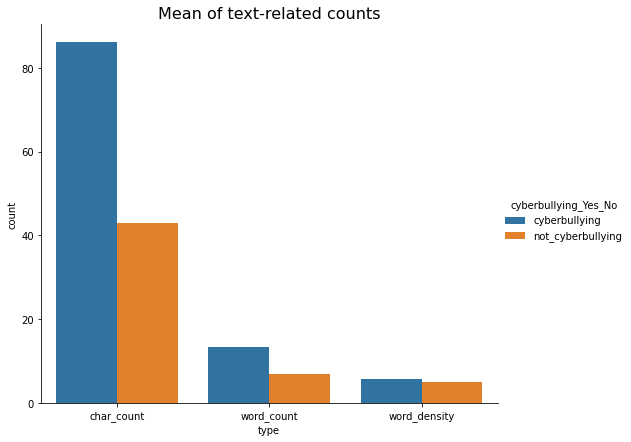

In [61]:
custom_palette = sns.color_palette("Paired", 9)
sns.catplot(x='type',y='count',data=mean_txtcount,hue='cyberbullying_Yes_No',kind='bar',height=6,aspect=1.2)
plt.title('Mean of text-related counts',size=16);

In [62]:
# Initialise some columns for feature's counts
data1['adj_count'] = 0
data1['adv_count'] = 0
data1['noun_count'] = 0
data1['num_count'] = 0
data1['pron_count'] = 0
data1['propn_count'] = 0
data1['verb_count'] = 0

__2.Parts of Speech (POS)__

In [63]:
nlp = spacy.load('en_core_web_sm')

Part of Speech in **SpaCy**

    POS   DESCRIPTION               EXAMPLES
    ----- ------------------------- ---------------------------------------------
    ADJ   adjective                 big, old, green, incomprehensible, first
    ADP   adposition                in, to, during
    ADV   adverb                    very, tomorrow, down, where, there
    AUX   auxiliary                 is, has (done), will (do), should (do)
    CONJ  conjunction               and, or, but
    CCONJ coordinating conjunction  and, or, but
    DET   determiner                a, an, the
    INTJ  interjection              psst, ouch, bravo, hello
    NOUN  noun                      girl, cat, tree, air, beauty
    NUM   numeral                   1, 2017, one, seventy-seven, IV, MMXIV
    PART  particle                  's, not,
    PRON  pronoun                   I, you, he, she, myself, themselves, somebody
    PROPN proper noun               Mary, John, London, NATO, HBO
    PUNCT punctuation               ., (, ), ?
    SCONJ subordinating conjunction if, while, that
    SYM   symbol                    $, %, §, ©, +, −, ×, ÷, =, :), 😝
    VERB  verb                      run, runs, running, eat, ate, eating
    X     other                     sfpksdpsxmsa
    SPACE space

In [64]:
%%time
# ANSWER
for i in range(data1.shape[0]):
    doc = nlp(data1.iloc[i]['cleaned_stopwords'])
    c = Counter([t.pos_ for t in doc])
    data1.at[i, 'adj_count'] = c['ADJ']
    data1.at[i, 'adv_count'] = c['ADV']
    data1.at[i, 'noun_count'] = c['NOUN']
    data1.at[i, 'num_count'] = c['NUM']
    data1.at[i, 'pron_count'] = c['PRON']
    data1.at[i, 'propn_count'] = c['PROPN']
    data1.at[i, 'verb_count'] = c['VERB']

CPU times: user 5min 10s, sys: 1.68 s, total: 5min 11s
Wall time: 5min 13s


In [65]:
cols = [
    'char_count', 'word_count', 'word_density',
    'punctuation_count', 'title_word_count', 
    'uppercase_word_count','adj_count',
    'adv_count', 'noun_count', 'num_count',
    'pron_count', 'propn_count', 'verb_count']

data1[cols].sample(5)

,char_count,word_count,word_density,punctuation_count,title_word_count,uppercase_word_count,adj_count,adv_count,noun_count,num_count,pron_count,propn_count,verb_count
39696,189,29,6.300000,5,0,0,4,1,10,0,4,2,6
40552,44,8,4.888889,0,0,0,4,0,0,0,0,0,3
45959,86,13,6.142857,1,0,0,1,2,2,0,0,6,2
18214,133,21,6.045455,7,0,0,3,2,8,0,1,0,6
23011,94,15,5.875000,0,0,0,0,0,6,0,0,4,3


In [66]:
# flattening data for plotting purposes
pos_count = data1.groupby('cyberbullying_Yes_No')[['adj_count','adv_count', 'pron_count','verb_count']].mean()
pos_count = pd.DataFrame(pos_count.stack())
pos_count.reset_index(inplace=True)
pos_count.rename(columns={
    0:'count','level_1':'type'},inplace=True)
pos_count

,cyberbullying_Yes_No,type,count
0,cyberbullying,adj_count,2.317408
1,cyberbullying,adv_count,0.719803
2,cyberbullying,pron_count,0.321886
3,cyberbullying,verb_count,2.820766
4,not_cyberbullying,adj_count,0.797483
5,not_cyberbullying,adv_count,0.374072
6,not_cyberbullying,pron_count,0.112901
7,not_cyberbullying,verb_count,1.427439


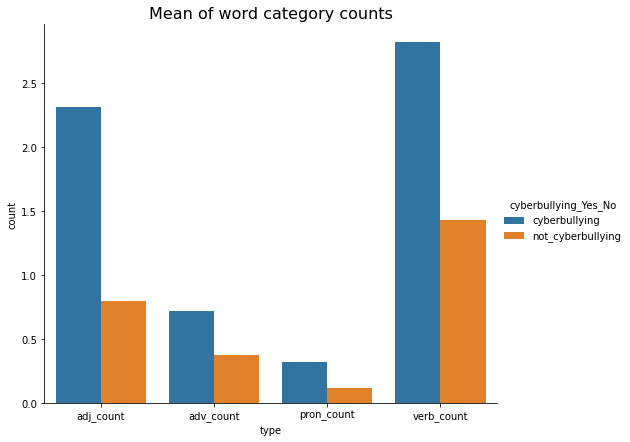

In [67]:
sns.catplot(x='type',y='count',data=pos_count,hue='cyberbullying_Yes_No',kind='bar',height=6,aspect=1.2)
plt.title('Mean of word category counts',size=16);

In [68]:
data1.sample(3)

,tweet_text,cyberbullying_type,cyberbullying_Yes_No,tweet_length,average_word_length,cleaned_text,cleaned_stopwords,Subjectivity,Polarity,Sentiment_Analysis,...,punctuation_count,title_word_count,uppercase_word_count,adj_count,adv_count,noun_count,num_count,pron_count,propn_count,verb_count
8554,Lmfaoooooooo when I call my female friends bit...,1,cyberbullying,8,5.38,lmfaoooooooo when i call my female friends bit...,lmfaoooooooo call female friend bitch,0.166667,0.0,0,...,0,0,0,1,0,3,0,0,1,0
12181,Feminazi (?),1,cyberbullying,2,5.50,feminazi (),feminazi (),0.000000,0.0,0,...,2,0,0,0,0,0,0,0,1,0
25479,@DarthConans i don't think i've dropped below ...,5,cyberbullying,12,5.42,i do not think i have dropped below % health w...,"think dropped % health leveling, lol",0.700000,0.8,1,...,2,0,0,0,0,3,0,0,0,3


In [69]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tweet_text            47692 non-null  object 
 1   cyberbullying_type    47692 non-null  int64  
 2   cyberbullying_Yes_No  47692 non-null  object 
 3   tweet_length          47692 non-null  int64  
 4   average_word_length   47692 non-null  float64
 5   cleaned_text          47692 non-null  object 
 6   cleaned_stopwords     47692 non-null  object 
 7   Subjectivity          47692 non-null  float64
 8   Polarity              47692 non-null  float64
 9   Sentiment_Analysis    47692 non-null  int64  
 10  char_count            47692 non-null  int64  
 11  word_count            47692 non-null  int64  
 12  word_density          47692 non-null  float64
 13  punctuation_count     47692 non-null  int64  
 14  title_word_count      47692 non-null  int64  
 15  uppercase_word_coun

## Split the data into train and test

In [70]:
# Features and Labels
X = data1['cleaned_stopwords']#Predictor Variable (47k,19)
y = data1['cyberbullying_type'] # Target Variable
print("X shape: {} \ny shape: {}".format(X.shape, y.shape))
X

X shape: (47692,) 
y shape: (47692,)


0                                 word , food crapilicious
1                                                    white
2                          classy whore red velvet cupcake
3        meh thanks head up, concerned another angry du...
4        isi account pretending kurdish account islam, lie
                               ...                        
47687    black ppl expected anything, depended anything...
47688    turner withhold disappointment turner called c...
47689    swear god dumb nigger bitch got bleach hair re...
47690    yea fuck youre nigger fucking unfollow me, fuc...
47691    bro gotta chill dog fuck kp dumb nigger bitch ...
Name: cleaned_stopwords, Length: 47692, dtype: object

In [71]:
# split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)
print("X_train shape: {} y_train shape: {}".format(X_train.shape, y_train.shape))
print("X_test shape : {} y_test shape: {}".format(X_test.shape, y_test.shape))


X_train shape: (38153,) y_train shape: (38153,)
X_test shape : (9539,) y_test shape: (9539,)


## Count Vectors as features

In [72]:
# create a count vectorizer object
count_vect = CountVectorizer(token_pattern = r'\w{1,}')

# Learn a vocabulary dictionary of all tokens in the raw documents
count_vect.fit(data1['cleaned_stopwords'])

# Transform documents to document-term matrix.
X_train_countv = count_vect.transform(X_train)
X_test_countv = count_vect.transform(X_test)

## TF-IDF Vectors as features
- Word level
- N-Gram level
- Character level

In [73]:
%%time
# word level tf-idf
tfidf_vect = TfidfVectorizer(analyzer = 'word',
                             token_pattern = r'\w{1,}',
                             max_features = 5000)
print(tfidf_vect)

tfidf_vect.fit(data['cleaned_stopwords'])
X_train_tfidf = tfidf_vect.transform(X_train)
X_test_tfidf  = tfidf_vect.transform(X_test)

TfidfVectorizer(max_features=5000, token_pattern='\\w{1,}')
CPU times: user 1.32 s, sys: 16 ms, total: 1.33 s
Wall time: 1.34 s


In [74]:
%%time
# ngram level tf-idf
tfidf_vect_ngram = TfidfVectorizer(analyzer = 'word',
                                   token_pattern = r'\w{1,}',
                                   ngram_range = (2, 3),
                                   max_features = 5000)
print(tfidf_vect_ngram)

tfidf_vect_ngram.fit(data1['cleaned_stopwords'])
X_train_tfidf_ngram = tfidf_vect_ngram.transform(X_train)
X_test_tfidf_ngram  = tfidf_vect_ngram.transform(X_test)

TfidfVectorizer(max_features=5000, ngram_range=(2, 3), token_pattern='\\w{1,}')
CPU times: user 4.39 s, sys: 152 ms, total: 4.54 s
Wall time: 4.58 s


In [75]:
%%time
# characters level tf-idf
tfidf_vect_ngram_chars = TfidfVectorizer(analyzer = 'char',
                                         token_pattern = r'\w{1,}',
                                         ngram_range = (2, 3),
                                         max_features = 5000)
print(tfidf_vect_ngram_chars)

tfidf_vect_ngram_chars.fit(data1['cleaned_stopwords'])
X_train_tfidf_ngram_chars = tfidf_vect_ngram_chars.transform(X_train)
X_test_tfidf_ngram_chars  = tfidf_vect_ngram_chars.transform(X_test)

TfidfVectorizer(analyzer='char', max_features=5000, ngram_range=(2, 3),
                token_pattern='\\w{1,}')


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/sklearn/feature_extraction/text.py:546: UserWarning:

The parameter 'token_pattern' will not be used since 'analyzer' != 'word'



CPU times: user 9.68 s, sys: 193 ms, total: 9.88 s
Wall time: 9.89 s


## Topic Models

In [76]:
lda_model = LatentDirichletAllocation(n_components = 30, learning_method = 'online', max_iter = 50)

def show_topic_word(data1):
    X_topics = lda_model.fit_transform(data1)
    topic_word = lda_model.components_ 
    vocab = count_vect.get_feature_names_out()
    n_top_words = 10
    topic_summaries = []
    print('Group Top Words')
    print('-----', '-'*80)
    for i, topic_dist in enumerate(topic_word):
        topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
        top_words = ' '.join(topic_words)
        topic_summaries.append(top_words)
        print('  %3d %s' % (i, top_words))

In [77]:
%%time
show_topic_word(X_train_countv)

Group Top Words
----- --------------------------------------------------------------------------------
    0 show twitter child care it racism colored without mind jew
    1 fuck nigger dumb as obama bitch nigga mad whole game
    2 muslim idiot islam religion ppl story also he non war
    3 joke rape gay make funny made people put done feel
    4 take yeah actually feminazi maybe back feminist liberal round wife
    5 woman right christian hate boy yall ugly yes little all
    6 need anything way black past people year make sorry old
    7 country wrong ignorant question cunt jesus law asking mention phone
    8 seen fear major needed out however idiots lord pc caused
    9 stupid go anyone today lt problem b enough one always
   10 name nothing quran isi skin fuckin color business hadith religious
   11 terrorist many world talk humanity jihad india killing pakistan innocent
   12 tell person find big time around post book claim week
   13 mean hindu someone used hell idea president 

# Modelling

In [78]:
## helper function
def train_model(classifier, X_train_data, y_train_data, X_test_data):
    # fit the training dataset on the classifier
    classifier.fit(X_train_data, y_train_data)

    # predict the labels on validation dataset
    predictions = classifier.predict(X_test_data)

    return accuracy_score(predictions, y_test),recall_score(predictions, y_test, average='macro'), \
precision_score(predictions, y_test,  average='macro')

In [79]:
# Keep the results in a dataframe
results = pd.DataFrame(columns = ['Classification Model',
                                  'Scoring',
                                  'Count Vectors',
                                  'WordLevel TF-IDF',
                                  'N-Gram Vectors',
                                  'CharLevel Vectors'])

- Multinomial Naive Bayes Classifier
- Bagging: Random Forest
- Gradient boosting 
- XGBoost

### Multinomial Naive Bayes Classifier

In [80]:
%%time
# Naive Bayes on Count Vectors
accuracy_mnb_cv, recall_mnb_cv, precision_mnb_cv = train_model(MultinomialNB(), X_train_countv, y_train, X_test_countv)
print('MultinomialNB, Count Vectors, Accuracy  : %.3f\n' % accuracy_mnb_cv)
print('MultinomialNB, Count Vectors, Recall  : %.3f\n' % recall_mnb_cv)
print('MultinomialNB, Count Vectors, Precision  : %.3f\n' % precision_mnb_cv)

MultinomialNB, Count Vectors, Accuracy  : 0.737

MultinomialNB, Count Vectors, Recall  : 0.720

MultinomialNB, Count Vectors, Precision  : 0.739

CPU times: user 26 ms, sys: 5.3 ms, total: 31.3 ms
Wall time: 33.2 ms


In [81]:
%%time
# Naive Bayes on td-idf (Word_level)
accuracy_mnb_tfidf, recall_mnb_tfidf, precision_mnb_tfidf = train_model(MultinomialNB(),X_train_tfidf, y_train, X_test_tfidf)
print('MultinomialNB, TD-IDF_word, Accuracy  : %.3f\n' % accuracy_mnb_tfidf)
print('MultinomialNB, TD-IDF_word, Recall  : %.3f\n' % recall_mnb_tfidf)
print('MultinomialNB, TD-IDF_word, Precision  : %.3f\n' % precision_mnb_tfidf)

MultinomialNB, TD-IDF_word, Accuracy  : 0.743

MultinomialNB, TD-IDF_word, Recall  : 0.727

MultinomialNB, TD-IDF_word, Precision  : 0.745

CPU times: user 22.5 ms, sys: 3.97 ms, total: 26.5 ms
Wall time: 24.1 ms


In [82]:
%%time
# Naive Bayes on td-idf (N_gram level)
accuracy_mnb_ngram, recall_mnb_ngram, precision_mnb_ngram = train_model(MultinomialNB(),X_train_tfidf_ngram, y_train, X_test_tfidf_ngram)
print('MultinomialNB, TD-IDF_ngram, Accuracy  : %.3f\n' % accuracy_mnb_ngram)
print('MultinomialNB, TD-IDF_ngram, Recall  : %.3f\n' % recall_mnb_ngram)
print('MultinomialNB, TD-IDF_ngram, Precision  : %.3f\n' % precision_mnb_ngram)

MultinomialNB, TD-IDF_ngram, Accuracy  : 0.619

MultinomialNB, TD-IDF_ngram, Recall  : 0.660

MultinomialNB, TD-IDF_ngram, Precision  : 0.623

CPU times: user 20.8 ms, sys: 4.13 ms, total: 24.9 ms
Wall time: 24 ms


In [83]:
%%time
# # Naive Bayes on Character Level TF IDF Vectors
accuracy_mnb_ngram_chars, recall_mnb_ngram_chars, precision_mnb_ngram_chars = train_model(MultinomialNB(), X_train_tfidf_ngram_chars, y_train, X_test_tfidf_ngram_chars)
print('MultinomialNB, TD-IDF_ngram_chars, Accuracy  : %.3f\n' % accuracy_mnb_ngram_chars)
print('MultinomialNB, TD-IDF_ngram_chars, Recall  : %.3f\n' % recall_mnb_ngram_chars)
print('MultinomialNB, TD-IDF_ngram_chars, Precision  : %.3f\n' % precision_mnb_ngram_chars)

MultinomialNB, TD-IDF_ngram_chars, Accuracy  : 0.722

MultinomialNB, TD-IDF_ngram_chars, Recall  : 0.715

MultinomialNB, TD-IDF_ngram_chars, Precision  : 0.724

CPU times: user 67.9 ms, sys: 30.7 ms, total: 98.6 ms
Wall time: 96.4 ms


In [84]:
# Scoring: accuracy 
results = results.append({
    'Classification Model': 'MultinomialNB',
    'Scoring': 'Accuracy',
    'Count Vectors': accuracy_mnb_cv,
    'WordLevel TF-IDF': accuracy_mnb_tfidf,
    'N-Gram Vectors': accuracy_mnb_ngram,
    'CharLevel Vectors': accuracy_mnb_ngram_chars},ignore_index=True)
# Scoring: Recall 
results = results.append({
    'Classification Model': 'MultinomialNB',
    'Scoring': 'Recall',
    'Count Vectors': recall_mnb_cv,
    'WordLevel TF-IDF': recall_mnb_tfidf,
    'N-Gram Vectors': recall_mnb_ngram,
    'CharLevel Vectors': recall_mnb_ngram_chars},ignore_index=True)
# Scoring: Precision
results = results.append({
    'Classification Model': 'MultinomialNB',
    'Scoring': 'Precision',
    'Count Vectors': precision_mnb_cv,
    'WordLevel TF-IDF': precision_mnb_tfidf,
    'N-Gram Vectors': precision_mnb_ngram,
    'CharLevel Vectors': precision_mnb_ngram_chars},ignore_index=True)

In [85]:
results

,Classification Model,Scoring,Count Vectors,WordLevel TF-IDF,N-Gram Vectors,CharLevel Vectors
0,MultinomialNB,Accuracy,0.736660,0.742740,0.618618,0.721983
1,MultinomialNB,Recall,0.719634,0.727268,0.660080,0.715314
2,MultinomialNB,Precision,0.739207,0.744925,0.622556,0.724118


### Bagging: Random Forest

In [86]:
gs_rf = GridSearchCV(RandomForestClassifier(),param_grid={
    'max_depth':[220,250],
    'n_estimators':[80,120]               
},scoring='f1_macro')

In [87]:
%%time
gs_rf.fit(X_train_countv,y_train)
gs_rf.best_estimator_

CPU times: user 35min 27s, sys: 7.51 s, total: 35min 35s
Wall time: 35min 45s


RandomForestClassifier(max_depth=250, n_estimators=120)

In [88]:
%%time
# Bagging (Random Forest) on Count Vectors
accuracy_rf_cv, recall_rf_cv, precision_rf_cv = train_model(gs_rf.best_estimator_, X_train_countv, y_train, X_test_countv)
print('RamdomForest, Count Vectors, Accuracy  : %.3f\n' % accuracy_rf_cv)
print('RamdomForest, Count Vectors, Recall  : %.3f\n' % recall_rf_cv)
print('RamdomForest, Count Vectors, Precision  : %.3f\n' % precision_rf_cv)

RamdomForest, Count Vectors, Accuracy  : 0.801

RamdomForest, Count Vectors, Recall  : 0.813

RamdomForest, Count Vectors, Precision  : 0.803

CPU times: user 2min 26s, sys: 451 ms, total: 2min 26s
Wall time: 2min 27s


In [89]:
%%time
# Bagging (Random Forest) on Word Level TF IDF Vectors
accuracy_rf_tfidf, recall_rf_tfidf, precision_rf_tfidf= train_model(gs_rf.best_estimator_, X_train_tfidf, y_train, X_test_tfidf)
print('RamdomForest, TD-IDF_word, Accuracy  : %.3f\n' % accuracy_rf_tfidf)
print('RamdomForest, TD-IDF_word, Recall  : %.3f\n' % recall_rf_tfidf)
print('RamdomForest, TD-IDF_word, Precision  : %.3f\n' % precision_rf_tfidf)

RamdomForest, TD-IDF_word, Accuracy  : 0.808

RamdomForest, TD-IDF_word, Recall  : 0.817

RamdomForest, TD-IDF_word, Precision  : 0.810

CPU times: user 42.1 s, sys: 141 ms, total: 42.2 s
Wall time: 42.3 s


In [90]:
%%time
# Bagging (Random Forest) on Ngram Level TF IDF Vectors
accuracy_rf_ngram, recall_rf_ngram, precision_rf_ngram = train_model(gs_rf.best_estimator_, X_train_tfidf_ngram, y_train, X_test_tfidf_ngram)
print('RamdomForest, TD-IDF_ngram, Accuracy  : %.3f\n' % accuracy_rf_ngram)
print('RamdomForest, TD-IDF_ngram, Recall  : %.3f\n' % recall_rf_ngram)
print('RamdomForest, TD-IDF_ngram, Precision  : %.3f\n' % precision_rf_ngram)

RamdomForest, TD-IDF_ngram, Accuracy  : 0.647

RamdomForest, TD-IDF_ngram, Recall  : 0.806

RamdomForest, TD-IDF_ngram, Precision  : 0.647

CPU times: user 9.34 s, sys: 31.6 ms, total: 9.37 s
Wall time: 9.38 s


In [91]:
%%time
# Bagging (Random Forest) on Character Level TF IDF Vectors
accuracy_rf_ngram_chars, recall_rf_ngram_chars, precision_rf_ngram_chars = train_model(gs_rf.best_estimator_, X_train_tfidf_ngram_chars, y_train, X_test_tfidf_ngram_chars)
print('RamdomForest, TD-IDF_ngram_chars, Accuracy  : %.3f\n' % accuracy_rf_ngram_chars)
print('RamdomForest, TD-IDF_ngram_chars, Recall  : %.3f\n' % recall_rf_ngram_chars)
print('RamdomForest, TD-IDF_ngram_chars, Precision  : %.3f\n' % precision_rf_ngram_chars)

RamdomForest, TD-IDF_ngram_chars, Accuracy  : 0.793

RamdomForest, TD-IDF_ngram_chars, Recall  : 0.804

RamdomForest, TD-IDF_ngram_chars, Precision  : 0.794

CPU times: user 3min 39s, sys: 374 ms, total: 3min 40s
Wall time: 3min 40s


In [92]:
# Scoring: accuracy 
results = results.append({
    'Classification Model': 'RamdomForest',
    'Scoring': 'Accuracy',
    'Count Vectors': accuracy_rf_cv,
    'WordLevel TF-IDF': accuracy_rf_tfidf,
    'N-Gram Vectors': accuracy_rf_ngram,
    'CharLevel Vectors': accuracy_rf_ngram_chars},ignore_index=True)
# Scoring: Recall 
results = results.append({
    'Classification Model': 'RamdomForest',
    'Scoring': 'Recall',
    'Count Vectors': recall_rf_cv,
    'WordLevel TF-IDF': recall_rf_tfidf,
    'N-Gram Vectors': recall_rf_ngram,
    'CharLevel Vectors': recall_rf_ngram_chars},ignore_index=True)
# Scoring: Precision
results = results.append({
    'Classification Model': 'RamdomForest',
    'Scoring': 'Precision',
    'Count Vectors': precision_rf_cv,
    'WordLevel TF-IDF': precision_rf_tfidf,
    'N-Gram Vectors': precision_rf_ngram,
    'CharLevel Vectors': precision_rf_ngram_chars},ignore_index=True)

### Boosting: Gradient Boosting

In [93]:
%%time
# Naive Bayes on Count Vectors
accuracy_gb_cv, recall_gb_cv, precision_gb_cv = train_model(GradientBoostingClassifier(n_estimators=150), X_train_countv, y_train, X_test_countv)
print('Gradient_Boost, Count Vectors, Accuracy  : %.3f\n' % accuracy_gb_cv)
print('Gradient_Boost, Count Vectors, Recall  : %.3f\n' % recall_gb_cv)
print('Gradient_Boost, Count Vectors, Precision  : %.3f\n' % precision_gb_cv)

Gradient_Boost, Count Vectors, Accuracy  : 0.812

Gradient_Boost, Count Vectors, Recall  : 0.847

Gradient_Boost, Count Vectors, Precision  : 0.814

CPU times: user 9min 22s, sys: 663 ms, total: 9min 23s
Wall time: 9min 23s


In [94]:
%%time
# Bagging (Random Forest) on Word Level TF IDF Vectors
accuracy_gb_tfidf, recall_gb_tfidf, precision_gb_tfidf= train_model(GradientBoostingClassifier(n_estimators=150), X_train_tfidf, y_train, X_test_tfidf)
print('Gradient_Boost, TD-IDF_word, Accuracy  : %.3f\n' % accuracy_gb_tfidf)
print('Gradient_Boost, TD-IDF_word, Recall  : %.3f\n' % recall_gb_tfidf)
print('Gradient_Boost, TD-IDF_word, Precision  : %.3f\n' % precision_gb_tfidf)

Gradient_Boost, TD-IDF_word, Accuracy  : 0.810

Gradient_Boost, TD-IDF_word, Recall  : 0.839

Gradient_Boost, TD-IDF_word, Precision  : 0.811

CPU times: user 1min 32s, sys: 188 ms, total: 1min 33s
Wall time: 1min 33s


In [95]:
%%time
# Naive Bayes on td-idf (N_gram level)
accuracy_gb_ngram, recall_gb_ngram, precision_gb_ngram = train_model(GradientBoostingClassifier(n_estimators=150),X_train_tfidf_ngram, y_train, X_test_tfidf_ngram)
print('Gradient_Boost, TD-IDF_ngram, Accuracy  : %.3f\n' % accuracy_gb_ngram)
print('Gradient_Boost, TD-IDF_ngram, Recall  : %.3f\n' % recall_gb_ngram)
print('Gradient_Boost, TD-IDF_ngram, Precision  : %.3f\n' % precision_gb_ngram)

Gradient_Boost, TD-IDF_ngram, Accuracy  : 0.632

Gradient_Boost, TD-IDF_ngram, Recall  : 0.820

Gradient_Boost, TD-IDF_ngram, Precision  : 0.632

CPU times: user 26.8 s, sys: 32.3 ms, total: 26.9 s
Wall time: 26.9 s


In [96]:
%%time
# # Naive Bayes on Character Level TF IDF Vectors
accuracy_gb_ngram_chars, recall_gb_ngram_chars, precision_gb_ngram_chars = train_model(GradientBoostingClassifier(n_estimators=150), X_train_tfidf_ngram_chars, y_train, X_test_tfidf_ngram_chars)
print('Gradient_Boost, TD-IDF_ngram_chars, Accuracy  : %.3f\n' % accuracy_gb_ngram_chars)
print('Gradient_Boost, TD-IDF_ngram_chars, Recall  : %.3f\n' % recall_gb_ngram_chars)
print('Gradient_Boost, TD-IDF_ngram_chars, Precision  : %.3f\n' % precision_gb_ngram_chars)

Gradient_Boost, TD-IDF_ngram_chars, Accuracy  : 0.812

Gradient_Boost, TD-IDF_ngram_chars, Recall  : 0.823

Gradient_Boost, TD-IDF_ngram_chars, Precision  : 0.813

CPU times: user 23min 23s, sys: 2.49 s, total: 23min 25s
Wall time: 23min 27s


In [97]:
# Scoring: accuracy 
results = results.append({
    'Classification Model': 'Gradient_Boost',
    'Scoring': 'Accuracy',
    'Count Vectors': accuracy_gb_cv,
    'WordLevel TF-IDF': accuracy_gb_tfidf,
    'N-Gram Vectors': accuracy_gb_ngram,
    'CharLevel Vectors': accuracy_gb_ngram_chars},ignore_index=True)
# Scoring: Recall 
results = results.append({
    'Classification Model': 'Gradient_Boost',
    'Scoring': 'Recall',
    'Count Vectors': recall_gb_cv,
    'WordLevel TF-IDF': recall_gb_tfidf,
    'N-Gram Vectors': recall_gb_ngram,
    'CharLevel Vectors': recall_gb_ngram_chars},ignore_index=True)
# Scoring: Precision
results = results.append({
    'Classification Model': 'Gradient_Boost',
    'Scoring': 'Precision',
    'Count Vectors': precision_gb_cv,
    'WordLevel TF-IDF': precision_gb_tfidf,
    'N-Gram Vectors': precision_gb_ngram,
    'CharLevel Vectors': precision_gb_ngram_chars},ignore_index=True)
results

,Classification Model,Scoring,Count Vectors,WordLevel TF-IDF,N-Gram Vectors,CharLevel Vectors
0,MultinomialNB,Accuracy,0.736660,0.742740,0.618618,0.721983
1,MultinomialNB,Recall,0.719634,0.727268,0.660080,0.715314
2,MultinomialNB,Precision,0.739207,0.744925,0.622556,0.724118
3,RamdomForest,Accuracy,0.801342,0.808051,0.646923,0.792641
4,RamdomForest,Recall,0.812947,0.817379,0.806312,0.804303
5,RamdomForest,Precision,0.802861,0.809634,0.646989,0.794073
6,Gradient_Boost,Accuracy,0.812244,0.809728,0.632037,0.811511
7,Gradient_Boost,Recall,0.846867,0.838923,0.819577,0.822922
8,Gradient_Boost,Precision,0.813587,0.811018,0.632083,0.812682


### XGBoost

In [98]:
xgb = XGBClassifier(n_estimators=300,max_depth=6,eta=0.1)

In [99]:
%%time
# Naive Bayes on Count Vectors
accuracy_xgb_cv, recall_xgb_cv, precision_xgb_cv = train_model(xgb, X_train_countv, y_train, X_test_countv)
print('XGBoost, Count Vectors, Accuracy  : %.3f\n' % accuracy_xgb_cv)
print('XGBoost, Count Vectors, Recall  : %.3f\n' % recall_xgb_cv)
print('XGBoost, Count Vectors, Precision  : %.3f\n' % precision_xgb_cv)

/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[00:55:38] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost, Count Vectors, Accuracy  : 0.818

XGBoost, Count Vectors, Recall  : 0.836

XGBoost, Count Vectors, Precision  : 0.820

CPU times: user 4min 31s, sys: 12.1 s, total: 4min 43s
Wall time: 45.8 s


In [100]:
%%time
# Bagging (Random Forest) on Word Level TF IDF Vectors
accuracy_xgb_tfidf, recall_xgb_tfidf, precision_xgb_tfidf= train_model(xgb, X_train_tfidf, y_train, X_test_tfidf)
print('XGBoost, TD-IDF_word, Accuracy  : %.3f\n' % accuracy_xgb_tfidf)
print('XGBoost, TD-IDF_word, Recall  : %.3f\n' % recall_xgb_tfidf)
print('XGBoost, TD-IDF_word, Precision  : %.3f\n' % precision_xgb_tfidf)

/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[00:56:24] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost, TD-IDF_word, Accuracy  : 0.816

XGBoost, TD-IDF_word, Recall  : 0.834

XGBoost, TD-IDF_word, Precision  : 0.817

CPU times: user 8min 3s, sys: 15.1 s, total: 8min 18s
Wall time: 1min 16s


In [101]:
%%time
# Naive Bayes on td-idf (N_gram level)
accuracy_xgb_ngram, recall_xgb_ngram, precision_xgb_ngram = train_model(xgb, X_train_tfidf_ngram, y_train, X_test_tfidf_ngram)
print('XGBoost, TD-IDF_ngram, Accuracy  : %.3f\n' % accuracy_xgb_ngram)
print('XGBoost, TD-IDF_ngram, Recall  : %.3f\n' % recall_xgb_ngram)
print('XGBoost, TD-IDF_ngram, Precision  : %.3f\n' % precision_xgb_ngram)

[00:57:41] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



XGBoost, TD-IDF_ngram, Accuracy  : 0.653

XGBoost, TD-IDF_ngram, Recall  : 0.795

XGBoost, TD-IDF_ngram, Precision  : 0.654

CPU times: user 2min 38s, sys: 10.2 s, total: 2min 48s
Wall time: 25.9 s


In [102]:
%%time
# # Naive Bayes on Character Level TF IDF Vectors
accuracy_xgb_ngram_chars, recall_xgb_ngram_chars, precision_xgb_ngram_chars = train_model(xgb, X_train_tfidf_ngram_chars, y_train, X_test_tfidf_ngram_chars)
print('XGBoost, TD-IDF_ngram_chars, Accuracy  : %.3f\n' % accuracy_xgb_ngram_chars)
print('XGBoost, TD-IDF_ngram_chars, Recall  : %.3f\n' % recall_xgb_ngram_chars)
print('XGBoost, TD-IDF_ngram_chars, Precision  : %.3f\n' % precision_xgb_ngram_chars)

/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[00:58:11] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost, TD-IDF_ngram_chars, Accuracy  : 0.808

XGBoost, TD-IDF_ngram_chars, Recall  : 0.820

XGBoost, TD-IDF_ngram_chars, Precision  : 0.809

CPU times: user 1h 50min 9s, sys: 1min 29s, total: 1h 51min 38s
Wall time: 16min 49s


In [103]:
%%time
# Scoring: accuracy 
results = results.append({
    'Classification Model': 'XGBoost',
    'Scoring': 'Accuracy',
    'Count Vectors': accuracy_xgb_cv,
    'WordLevel TF-IDF': accuracy_xgb_tfidf,
    'N-Gram Vectors': accuracy_xgb_ngram,
    'CharLevel Vectors': accuracy_xgb_ngram_chars},ignore_index=True)
results

CPU times: user 46.3 ms, sys: 26.4 ms, total: 72.6 ms
Wall time: 17.3 ms


,Classification Model,Scoring,Count Vectors,WordLevel TF-IDF,N-Gram Vectors,CharLevel Vectors
0,MultinomialNB,Accuracy,0.736660,0.742740,0.618618,0.721983
1,MultinomialNB,Recall,0.719634,0.727268,0.660080,0.715314
2,MultinomialNB,Precision,0.739207,0.744925,0.622556,0.724118
3,RamdomForest,Accuracy,0.801342,0.808051,0.646923,0.792641
4,RamdomForest,Recall,0.812947,0.817379,0.806312,0.804303
5,RamdomForest,Precision,0.802861,0.809634,0.646989,0.794073
6,Gradient_Boost,Accuracy,0.812244,0.809728,0.632037,0.811511
7,Gradient_Boost,Recall,0.846867,0.838923,0.819577,0.822922
8,Gradient_Boost,Precision,0.813587,0.811018,0.632083,0.812682
9,XGBoost,Accuracy,0.818220,0.815914,0.653318,0.808156


In [104]:
%%time
# Scoring: Recall 
results = results.append({
    'Classification Model': 'XGBoost',
    'Scoring': 'Recall',
    'Count Vectors': recall_xgb_cv,
    'WordLevel TF-IDF': recall_xgb_tfidf,
    'N-Gram Vectors': recall_xgb_ngram,
    'CharLevel Vectors': recall_xgb_ngram_chars},ignore_index=True)

CPU times: user 12 ms, sys: 5.84 ms, total: 17.9 ms
Wall time: 3.43 ms


In [105]:
%%time
# Scoring: Precision
results = results.append({
    'Classification Model': 'XGBoost',
    'Scoring': 'Precision',
    'Count Vectors': precision_xgb_cv,
    'WordLevel TF-IDF': precision_xgb_tfidf,
    'N-Gram Vectors': precision_xgb_ngram,
    'CharLevel Vectors': precision_xgb_ngram_chars},ignore_index=True)

CPU times: user 9.84 ms, sys: 4.96 ms, total: 14.8 ms
Wall time: 3.2 ms


# Data Visualisation 

In [106]:
results.loc[results['Scoring']=='Accuracy',:]['Classification Model'].value_counts().index

Index(['MultinomialNB', 'RamdomForest', 'Gradient_Boost', 'XGBoost'], dtype='object')

CPU times: user 119 ms, sys: 31.6 ms, total: 150 ms
Wall time: 199 ms


Text(0.5, 20.80000000000001, 'Scores')

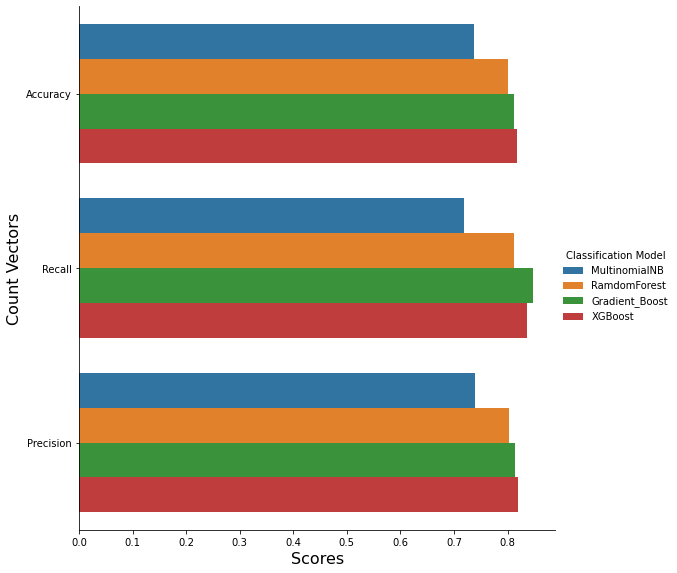

In [130]:
%%time
# Wordlevel Tf-IDF visualization
sns.catplot(x='Count Vectors',y='Scoring',hue='Classification Model',data=results,kind='bar',orient='h',height=8,aspect=1)
plt.ylabel('Count Vectors',size=16)
plt.xlabel('Scores',size=16);

CPU times: user 130 ms, sys: 13.4 ms, total: 144 ms
Wall time: 164 ms


Text(0.5, 20.80000000000001, 'Scores')

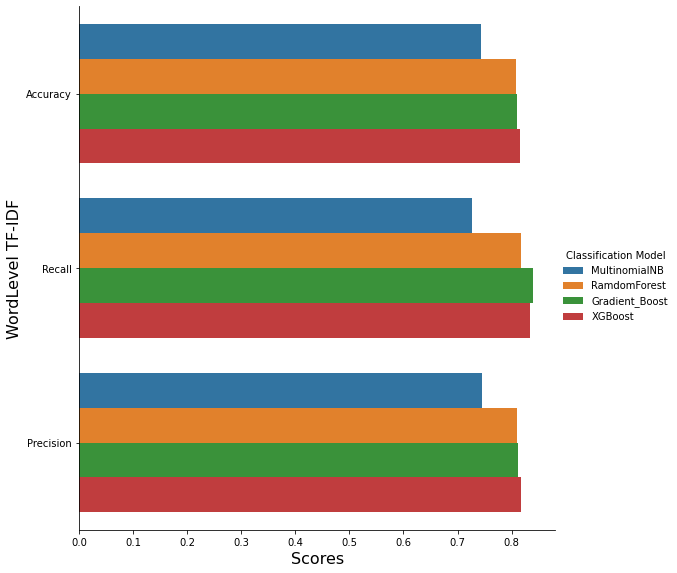

In [108]:
%%time
# Wordlevel Tf-IDF visualization
sns.catplot(x='WordLevel TF-IDF',y='Scoring',hue='Classification Model',data=results,kind='bar',orient='h',height=8,aspect=1)
plt.ylabel('WordLevel TF-IDF',size=16)
plt.xlabel('Scores',size=16);

CPU times: user 140 ms, sys: 6.46 ms, total: 147 ms
Wall time: 148 ms


Text(0.5, 20.80000000000001, 'Scores')

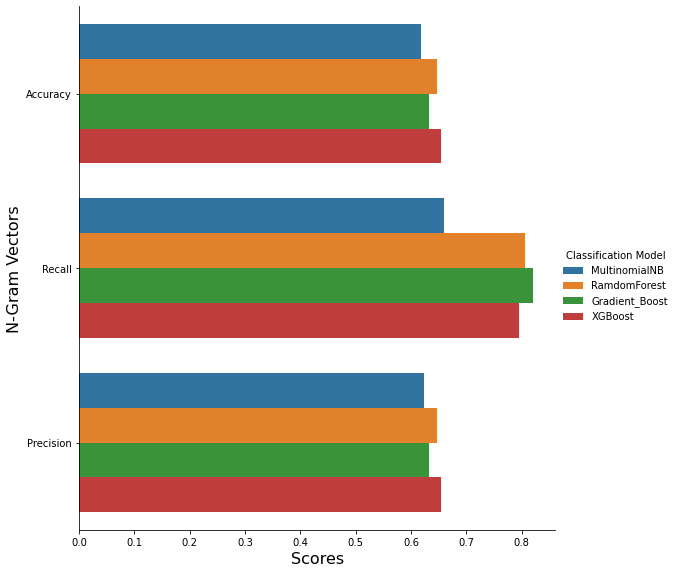

In [109]:
%%time
# Ngram level Tf-IDF visualization
sns.catplot(x='N-Gram Vectors',y='Scoring',hue='Classification Model',data=results,kind='bar',orient='h',height=8,aspect=1)
plt.ylabel('N-Gram Vectors',size=16)
plt.xlabel('Scores',size=16);

CPU times: user 139 ms, sys: 6.41 ms, total: 146 ms
Wall time: 147 ms


Text(0.5, 20.80000000000001, 'Scores')

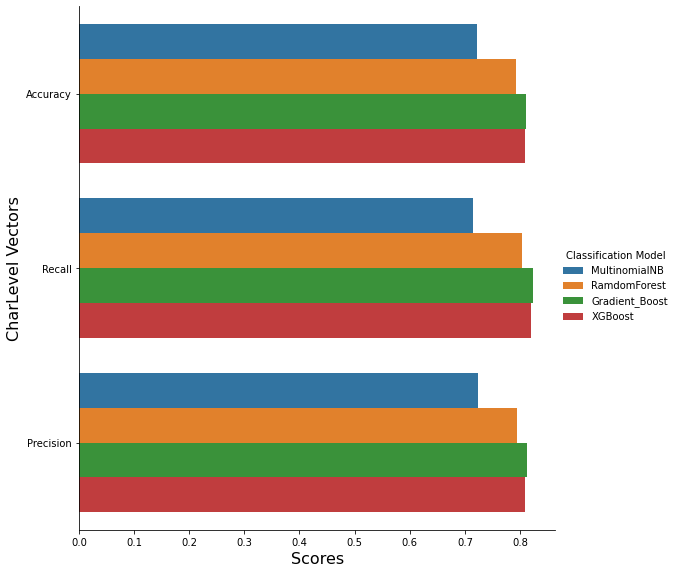

In [110]:
%%time
# CharLevel Tf-IDF visualization
sns.catplot(x='CharLevel Vectors',y='Scoring',hue='Classification Model',data=results,kind='bar',orient='h',height=8,aspect=1)
plt.ylabel('CharLevel Vectors',size=16)
plt.xlabel('Scores',size=16);

In [111]:
%%time
results.loc[results['Scoring']=='Accuracy',:]

CPU times: user 513 µs, sys: 8 µs, total: 521 µs
Wall time: 523 µs


,Classification Model,Scoring,Count Vectors,WordLevel TF-IDF,N-Gram Vectors,CharLevel Vectors
0,MultinomialNB,Accuracy,0.736660,0.742740,0.618618,0.721983
3,RamdomForest,Accuracy,0.801342,0.808051,0.646923,0.792641
6,Gradient_Boost,Accuracy,0.812244,0.809728,0.632037,0.811511
9,XGBoost,Accuracy,0.818220,0.815914,0.653318,0.808156


CPU times: user 37.9 ms, sys: 5.13 ms, total: 43 ms
Wall time: 46.8 ms


Text(0.5, 1.0, 'Accuracy Scores of features used')

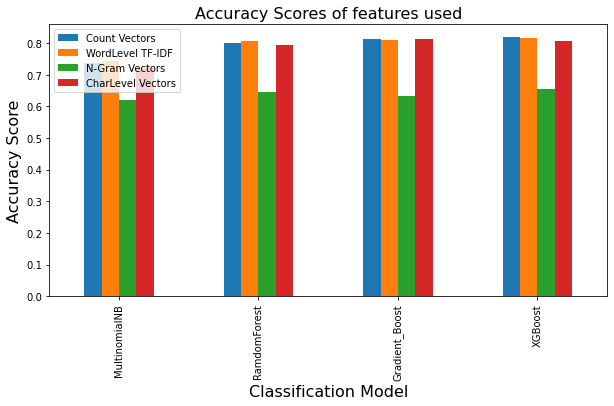

In [112]:
%%time
results.loc[results['Scoring']=='Accuracy',:].\
plot(x="Classification Model", y=["Count Vectors", "WordLevel TF-IDF", "N-Gram Vectors", "CharLevel Vectors"], kind="bar",figsize=(10,5))
plt.ylabel('Accuracy Score',size=16)
plt.xlabel('Classification Model',size=16)
plt.title('Accuracy Scores of features used',size=16);

In [113]:
%%time
results.loc[results['Scoring']=='Accuracy',['Count Vectors','Classification Model']].sort_values(by='Count Vectors',ascending=False)

CPU times: user 2.05 ms, sys: 619 µs, total: 2.66 ms
Wall time: 2.21 ms


,Count Vectors,Classification Model
9,0.818220,XGBoost
6,0.812244,Gradient_Boost
3,0.801342,RamdomForest
0,0.736660,MultinomialNB


CPU times: user 23.7 ms, sys: 3.67 ms, total: 27.4 ms
Wall time: 25 ms


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



(0.0, 1.0)

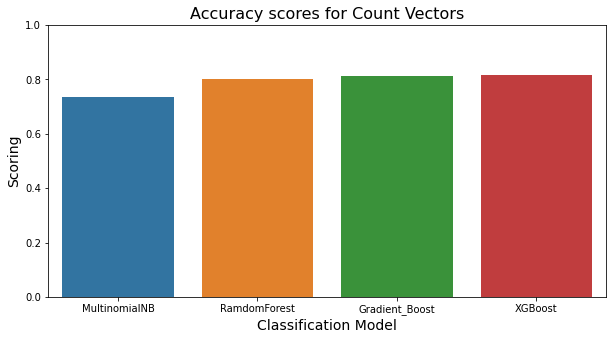

In [114]:
%%time
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','Count Vectors', data=results.loc[results['Scoring']=='Accuracy',:])
plt.title('Accuracy scores for Count Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



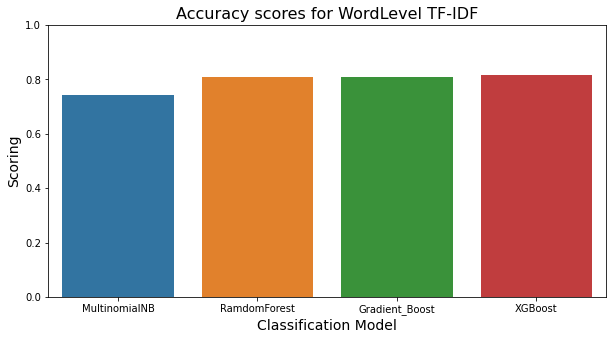

In [115]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','WordLevel TF-IDF', data=results.loc[results['Scoring']=='Accuracy',:])
plt.title('Accuracy scores for WordLevel TF-IDF',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



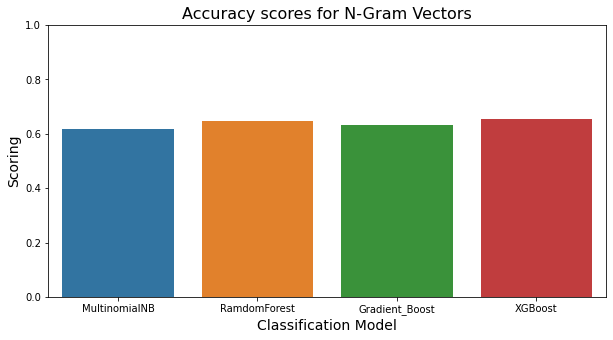

In [116]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','N-Gram Vectors', data=results.loc[results['Scoring']=='Accuracy',:])
plt.title('Accuracy scores for N-Gram Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



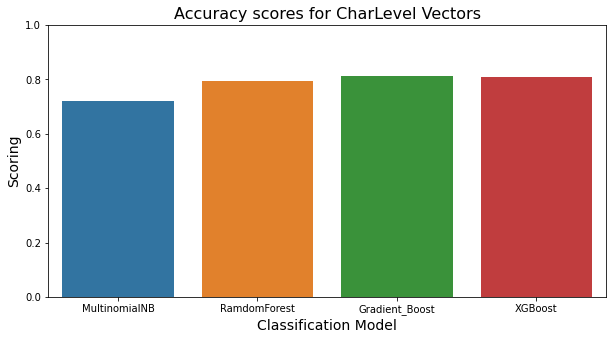

In [117]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','CharLevel Vectors', data=results.loc[results['Scoring']=='Accuracy',:])
plt.title('Accuracy scores for CharLevel Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);

__Recall Scores__

In [118]:
results.loc[results['Scoring']=='Recall',:]

,Classification Model,Scoring,Count Vectors,WordLevel TF-IDF,N-Gram Vectors,CharLevel Vectors
1,MultinomialNB,Recall,0.719634,0.727268,0.660080,0.715314
4,RamdomForest,Recall,0.812947,0.817379,0.806312,0.804303
7,Gradient_Boost,Recall,0.846867,0.838923,0.819577,0.822922
10,XGBoost,Recall,0.835986,0.833928,0.795216,0.820241


In [119]:
results.loc[results['Scoring']=='Recall',['Count Vectors','Classification Model']].sort_values(by='Count Vectors',ascending=False)

,Count Vectors,Classification Model
7,0.846867,Gradient_Boost
10,0.835986,XGBoost
4,0.812947,RamdomForest
1,0.719634,MultinomialNB


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



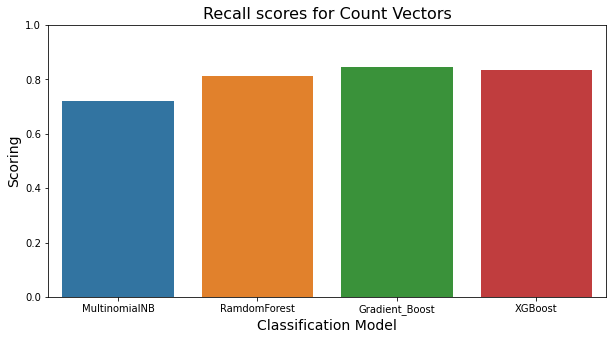

In [120]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','Count Vectors', data=results.loc[results['Scoring']=='Recall',:])
plt.title('Recall scores for Count Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



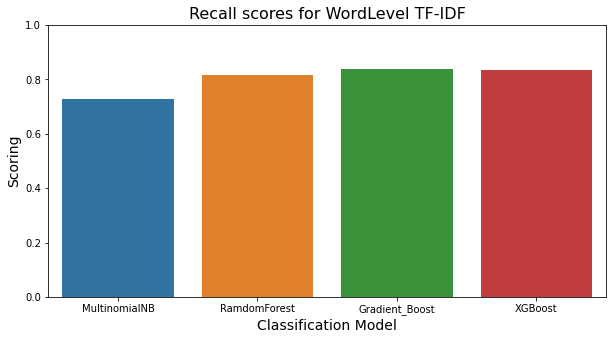

In [121]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','WordLevel TF-IDF', data=results.loc[results['Scoring']=='Recall',:])
plt.title('Recall scores for WordLevel TF-IDF',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



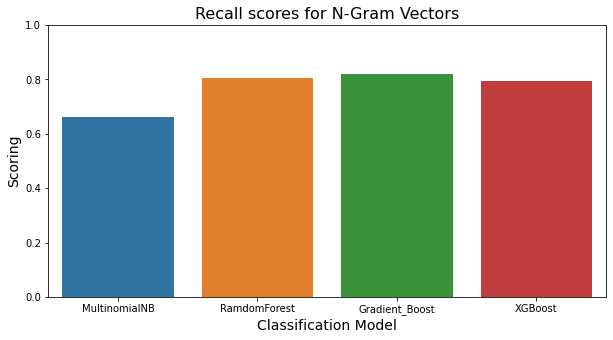

In [122]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','N-Gram Vectors', data=results.loc[results['Scoring']=='Recall',:])
plt.title('Recall scores for N-Gram Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



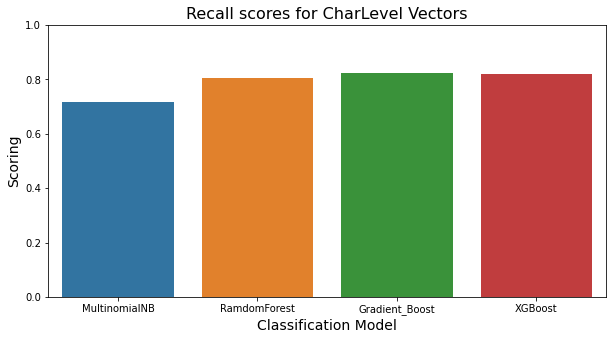

In [123]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','CharLevel Vectors', data=results.loc[results['Scoring']=='Recall',:])
plt.title('Recall scores for CharLevel Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);

__Precision Scores__

In [124]:
results.loc[results['Scoring']=='Precision',:]

,Classification Model,Scoring,Count Vectors,WordLevel TF-IDF,N-Gram Vectors,CharLevel Vectors
2,MultinomialNB,Precision,0.739207,0.744925,0.622556,0.724118
5,RamdomForest,Precision,0.802861,0.809634,0.646989,0.794073
8,Gradient_Boost,Precision,0.813587,0.811018,0.632083,0.812682
11,XGBoost,Precision,0.819568,0.817248,0.653550,0.809459


In [125]:
results.loc[results['Scoring']=='Precision',['Count Vectors','Classification Model']].sort_values(by='Count Vectors',ascending=False)

,Count Vectors,Classification Model
11,0.819568,XGBoost
8,0.813587,Gradient_Boost
5,0.802861,RamdomForest
2,0.739207,MultinomialNB


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



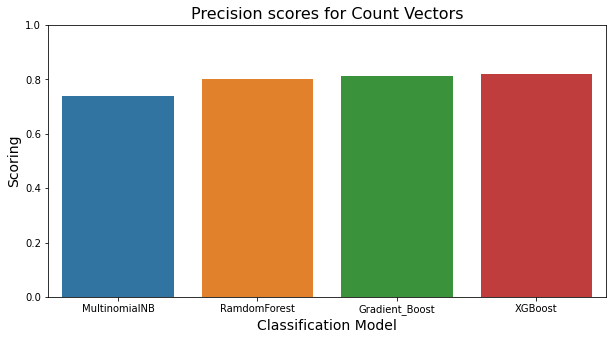

In [126]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','Count Vectors', data=results.loc[results['Scoring']=='Precision',:])
plt.title('Precision scores for Count Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



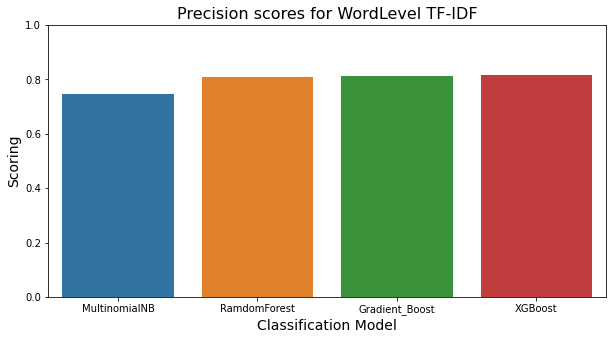

In [127]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','WordLevel TF-IDF', data=results.loc[results['Scoring']=='Precision',:])
plt.title('Precision scores for WordLevel TF-IDF',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



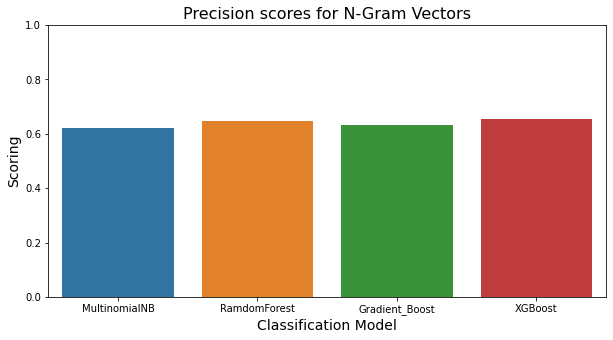

In [128]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','N-Gram Vectors', data=results.loc[results['Scoring']=='Precision',:])
plt.title('Precision scores for N-Gram Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);


/Users/anna_hj/opt/anaconda3/envs/IOD-deep-learning/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



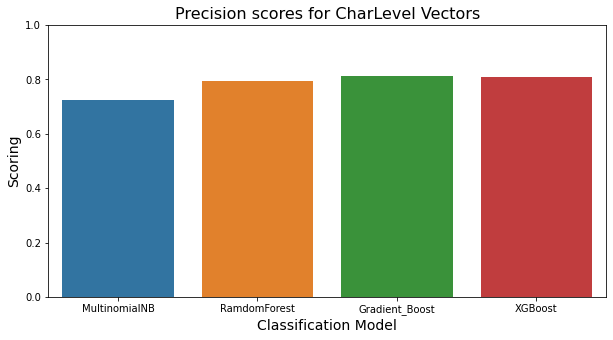

In [129]:
fig, axes = plt.subplots(figsize=(10,5))
sns.barplot('Classification Model','CharLevel Vectors', data=results.loc[results['Scoring']=='Precision',:])
plt.title('Precision scores for CharLevel Vectors',size=16)
plt.ylabel('Scoring',size=14)
plt.xlabel('Classification Model',size=14)
axes.set_ylim(0, 1);